# How Time, Technology, and Method Have Shaped Exoplanet Discovery

**Guiding question:** How have time, detection technology, and observational
methods shaped *where* and *what types* of exoplanets humanity has discovered?

**Dataset:** NASA Exoplanet Archive — Planetary Systems Composite Parameters
table (`PSCompPars`), one row per confirmed planet, pulled 2026-08-25.

**Sections:**
0. Setup & cleaning
1. Discovery Timeline — *temporal visualisation*
2. Discovery Method Comparison — *categorical analysis*
3. Planet Radius vs. Orbital Period — *multivariate analysis*
4. Distance vs. Discovery Year — *relationship analysis*
5. 3D Spatial Distribution — RA / Dec / Distance in Cartesian space
6. Takeaways


In [32]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_theme(style="whitegrid", context="notebook")
plt.rcParams["figure.dpi"] = 110
plt.rcParams["font.size"] = 11

METHOD_ORDER = [
    "Transit", "Radial Velocity", "Microlensing", "Imaging",
    "Transit Timing Variations", "Eclipse Timing Variations",
    "Orbital Brightness Modulation", "Pulsar Timing", "Astrometry",
    "Pulsation Timing Variations", "Disk Kinematics",
]

# A consistent colour per method used across every chart in the notebook
PALETTE = dict(zip(METHOD_ORDER, sns.color_palette("tab10", len(METHOD_ORDER)) +
                    sns.color_palette("Set2", max(0, len(METHOD_ORDER) - 10))))


In [33]:
# The file has a long '#'-commented header written by the Exoplanet Archive
df = pd.read_csv("exoplanets.csv", comment="#")
print(df.shape)
df.head(3)


(6354, 84)


,pl_name,hostname,sy_snum,sy_pnum,discoverymethod,disc_year,disc_facility,pl_controv_flag,pl_orbper,pl_orbpererr1,...,sy_disterr2,sy_vmag,sy_vmagerr1,sy_vmagerr2,sy_kmag,sy_kmagerr1,sy_kmagerr2,sy_gaiamag,sy_gaiamagerr1,sy_gaiamagerr2
0,11 Com b,11 Com,2,1,Radial Velocity,2007,Xinglong Station,0,323.21000,0.06,...,-1.9238,4.72307,0.023,-0.023,2.282,0.346,-0.346,4.44038,0.003848,-0.003848
1,11 UMi b,11 UMi,1,1,Radial Velocity,2009,Thueringer Landessternwarte Tautenburg,0,516.21997,3.20,...,-1.9765,5.01300,0.005,-0.005,1.939,0.270,-0.270,4.56216,0.003903,-0.003903
2,14 And b,14 And,1,1,Radial Velocity,2008,Okayama Astrophysical Observatory,0,186.76000,0.11,...,-0.7140,5.23133,0.023,-0.023,2.331,0.240,-0.240,4.91781,0.002826,-0.002826


## 0. Setup & Cleaning

We only keep the columns needed for this analysis, drop rows with no
discovery year, and cast a few types.


In [34]:
cols = [
    "pl_name", "hostname", "discoverymethod", "disc_year", "disc_facility",
    "pl_orbper", "pl_orbsmax", "pl_rade", "pl_bmasse", "pl_eqt",
    "sy_dist", "ra", "dec",
]
data = df[cols].copy()

data["disc_year"] = pd.to_numeric(data["disc_year"], errors="coerce")
data = data.dropna(subset=["disc_year", "discoverymethod"])
data["disc_year"] = data["disc_year"].astype(int)

# Group rare methods into "Other" for readability in charts
top_methods = data["discoverymethod"].value_counts().head(4).index.tolist()
data["method_grp"] = np.where(data["discoverymethod"].isin(top_methods),
                               data["discoverymethod"], "Other")

print(f"{len(data)} confirmed planets, {data['disc_year'].min()}-{data['disc_year'].max()}")
data["discoverymethod"].value_counts()


6354 confirmed planets, 1992-2026


discoverymethod
Transit                          4688
Radial Velocity                  1200
Microlensing                      283
Imaging                            98
Transit Timing Variations          42
Eclipse Timing Variations          17
Orbital Brightness Modulation       9
Pulsar Timing                       8
Astrometry                          6
Pulsation Timing Variations         2
Disk Kinematics                     1
Name: count, dtype: int64

## 1. Discovery Timeline (Temporal Visualisation)

Counts per year, split by detection method, plus a cumulative total
annotated with the missions/surveys that drove each jump. The story: the
discovery *rate* is a technology story, not a steady trickle — a handful of
missions dominate a handful of years each.


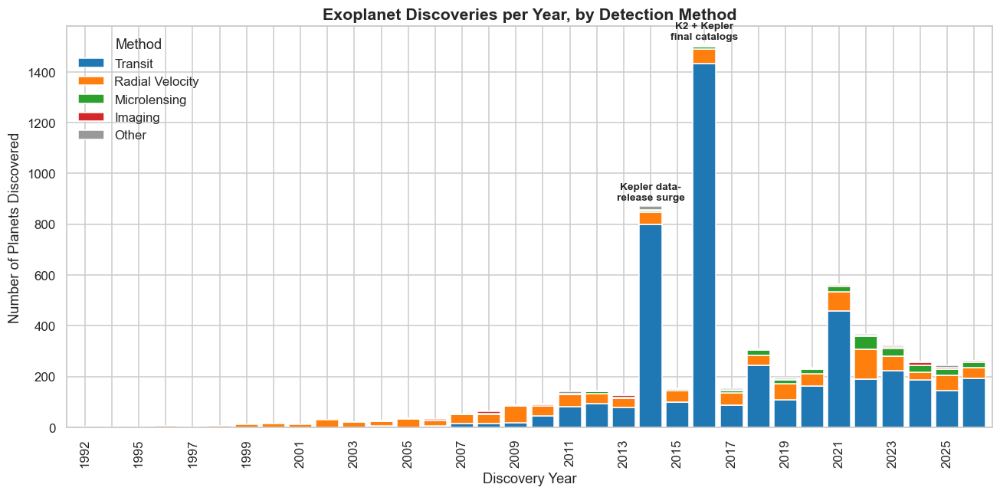

In [50]:
year_method = (data.groupby(["disc_year", "method_grp"]).size()
               .unstack(fill_value=0)
               .reindex(columns=top_methods + ["Other"], fill_value=0))

fig, ax = plt.subplots(figsize=(12, 6))
year_method.plot(kind="bar", stacked=True, ax=ax,
                  color=[PALETTE.get(m, "#999999") for m in year_method.columns],
                  width=0.85)

ax.set_title("Exoplanet Discoveries per Year, by Detection Method", fontsize=14, weight="bold")
ax.set_xlabel("Discovery Year")
ax.set_ylabel("Number of Planets Discovered")
ax.legend(title="Method", frameon=False, loc="upper left")

for i, label in enumerate(ax.get_xticklabels()):
    label.set_visible(i % 2 == 0)
    label.set_rotation(90)

annotations = {
    2014: "Kepler data-\nrelease surge",
    2016: "K2 + Kepler\nfinal catalogs",
}
for year, text in annotations.items():
    if year in year_method.index:
        y = year_method.loc[year].sum()
        ax.annotate(text, xy=(list(year_method.index).index(year), y),
                    xytext=(0, 5), textcoords="offset points",
                    ha="center", fontsize=9, weight="bold",
                    arrowprops=dict(arrowstyle="->", lw=1))

plt.tight_layout()
plt.show()


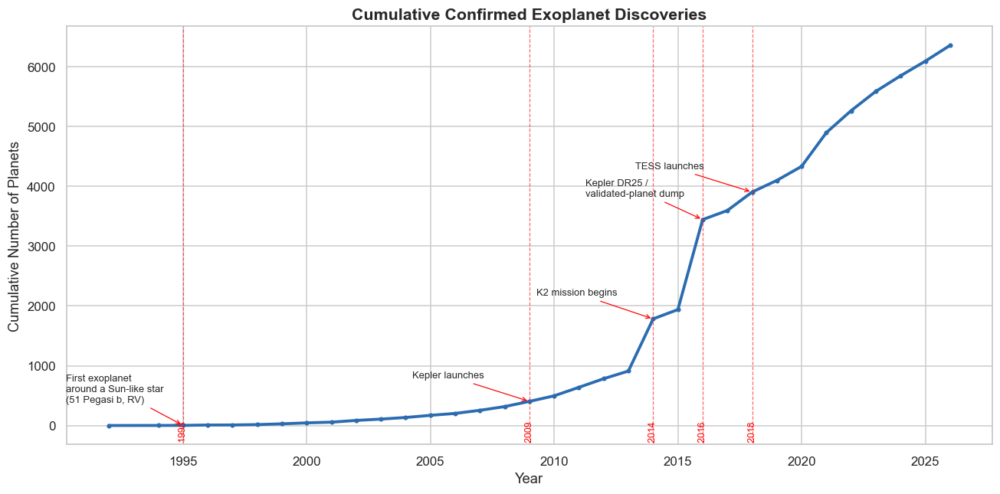

In [61]:
# Cumulative discoveries, annotated with mission launch / key data-release years.
MISSION_EVENTS = [
    (1995, "First exoplanet\naround a Sun-like star\n(51 Pegasi b, RV)"),
    (2009, "Kepler launches"),
    (2014, "K2 mission begins"),
    (2016, "Kepler DR25 /\nvalidated-planet dump"),
    (2018, "TESS launches"),
]

cum = data.groupby("disc_year").size().sort_index().cumsum()

fig, ax = plt.subplots(figsize=(12, 6))
ax.plot(cum.index, cum.values, color="#2b6cb0", lw=2.5, marker="o", markersize=3)
ax.set_title("Cumulative Confirmed Exoplanet Discoveries", fontsize=14, weight="bold")
ax.set_xlabel("Year")
ax.set_ylabel("Cumulative Number of Planets")

for year, label in MISSION_EVENTS:
    if year in cum.index:
        y = cum.loc[year]
        ax.axvline(year, color="red", ls="--", lw=0.8, alpha=0.6)
        ax.annotate(label, xy=(year, y), xytext=(-100, 20),
                    textcoords="offset points", fontsize=8.5,
                    arrowprops=dict(arrowstyle="->", lw=0.8, color="red"))
        ax.text(year, ax.get_ylim()[0] , f' {year}', color="red", ha='center', va='bottom', rotation=90, fontsize=8)

plt.tight_layout()
plt.show()


**Reading this pair of charts:** the stacked bar shows *which method* was
active in a given year; the cumulative line shows *how fast* the field grew
overall. The two Kepler-era spikes (roughly 2014 and 2016) are batch
validations of a single spacecraft's backlog, not thousands of independent
real-time discoveries — worth calling out explicitly so the reader doesn't
over-interpret the spike as "the whole field sped up."


## 2. Discovery Method Comparison (Categorical Analysis)

Each detection technique has its own observational bias:
- **Transit** — sensitive to planets whose orbit happens to cross the
  star's disc as seen from Earth; biased toward large, close-in planets.
- **Radial Velocity** — detects the star's wobble; biased toward massive
  planets, historically biased toward shorter periods (long baselines are
  expensive in telescope time).
- **Microlensing** — roughly independent of the planet's own brightness;
  favors planets a few AU out, often around faint/distant stars.
- **Imaging** — requires a planet bright and far enough from its star to
  resolve; biased toward young, massive, wide-separation planets.

We compare the methods as categories: how many planets each has found, and
what those planets look like.


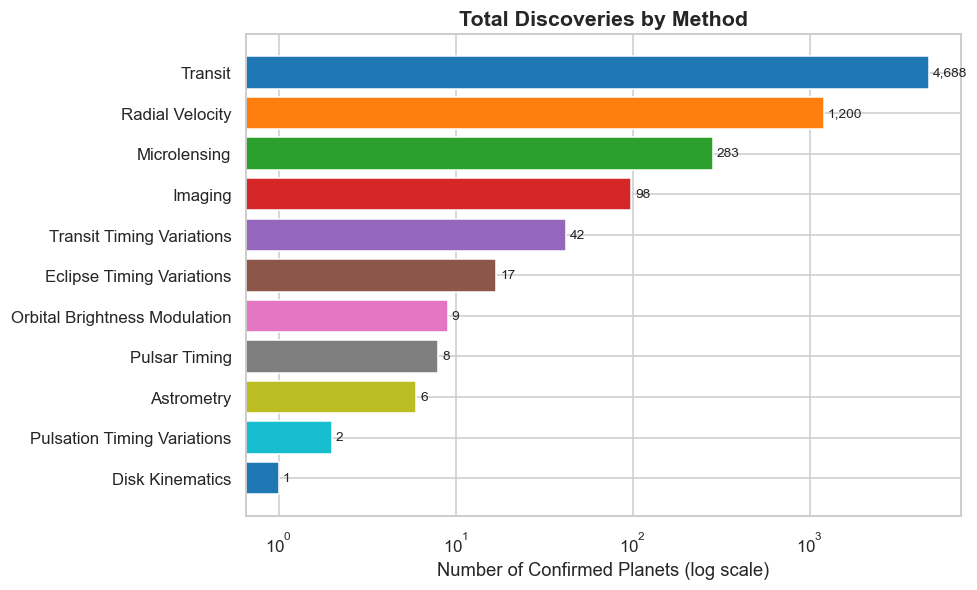

In [37]:
plot_df = data[data["discoverymethod"].isin(top_methods)].copy()

method_counts = data["discoverymethod"].value_counts()

fig, ax = plt.subplots(figsize=(9, 5.5))
bars = ax.barh(method_counts.index[::-1], method_counts.values[::-1],
                color=[PALETTE.get(m, "#999999") for m in method_counts.index[::-1]])
ax.set_xscale("log")
ax.set_xlabel("Number of Confirmed Planets (log scale)")
ax.set_title("Total Discoveries by Method", fontsize=14, weight="bold")
for bar, val in zip(bars, method_counts.values[::-1]):
    ax.text(val * 1.05, bar.get_y() + bar.get_height() / 2, f"{val:,}",
            va="center", fontsize=9)
plt.tight_layout()
plt.show()


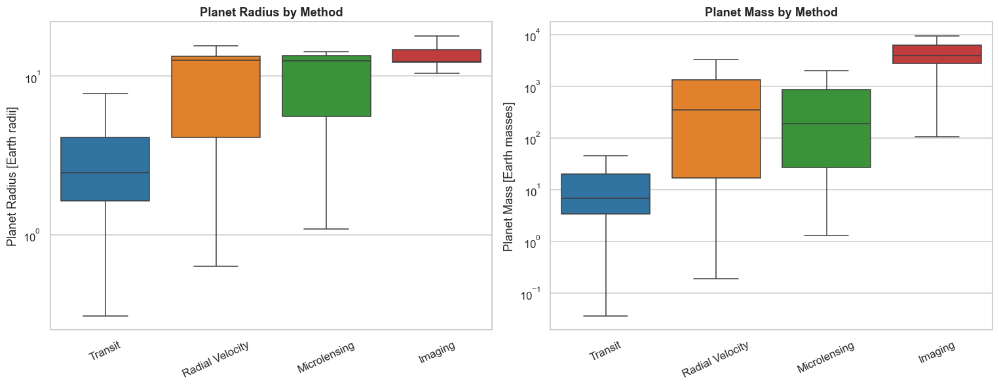

In [38]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5.5))

sns.boxplot(data=plot_df, x="discoverymethod", y="pl_rade", order=top_methods,
            hue="discoverymethod", palette=PALETTE, legend=False,
            ax=axes[0], showfliers=False)
axes[0].set_yscale("log")
axes[0].set_title("Planet Radius by Method", weight="bold")
axes[0].set_xlabel(""); axes[0].set_ylabel("Planet Radius [Earth radii]")
axes[0].tick_params(axis="x", rotation=25)

sns.boxplot(data=plot_df, x="discoverymethod", y="pl_bmasse", order=top_methods,
            hue="discoverymethod", palette=PALETTE, legend=False,
            ax=axes[1], showfliers=False)
axes[1].set_yscale("log")
axes[1].set_title("Planet Mass by Method", weight="bold")
axes[1].set_xlabel(""); axes[1].set_ylabel("Planet Mass [Earth masses]")
axes[1].tick_params(axis="x", rotation=25)

plt.tight_layout()
plt.show()


Transit dominates by sheer count (thanks to Kepler/K2/TESS surveying huge
star fields at once) but skews toward smaller radii; radial velocity finds
far fewer planets but skews toward higher mass, since it's measuring mass
directly; microlensing and imaging are rarer and each occupy a distinct
size/mass regime.


## 3. Planet Radius vs. Orbital Period (Multivariate Analysis)

A single scatter plot carrying four variables at once: orbital period (x),
planet radius (y), detection method (colour), and planet mass (marker
size). This is the classic exoplanet discovery-space plot, and it makes the
per-method biases from Section 2 visible as literal clusters.


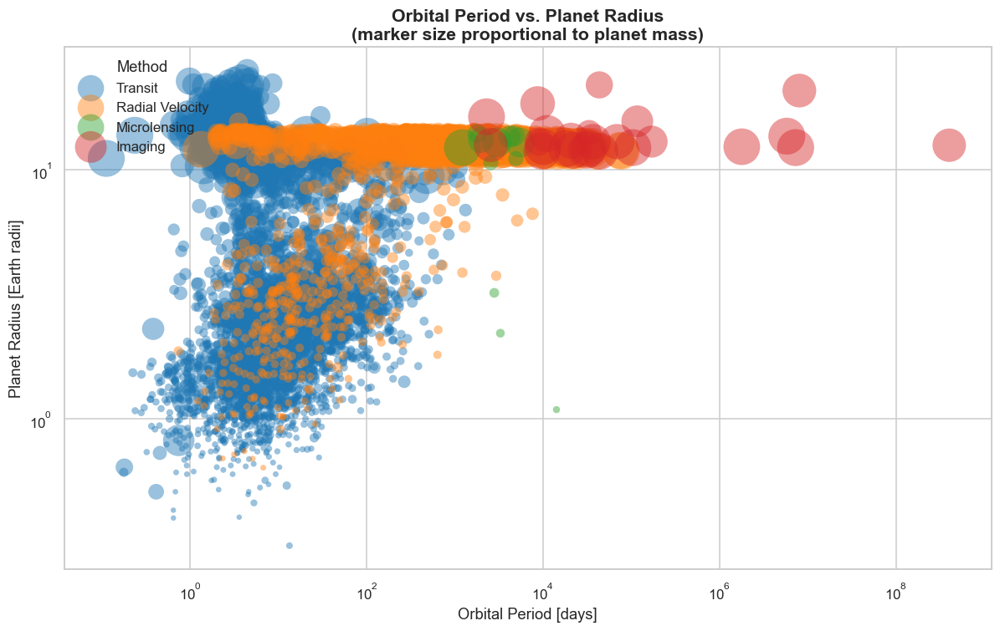

In [39]:
fig, ax = plt.subplots(figsize=(11, 7))

size_df = plot_df.dropna(subset=["pl_orbper", "pl_rade", "pl_bmasse"])
# Scale marker size by mass (sqrt scaling keeps huge masses from dominating)
sizes = 15 + 40 * np.sqrt(size_df["pl_bmasse"].clip(upper=size_df["pl_bmasse"].quantile(0.98)) /
                           size_df["pl_bmasse"].median())

for method in top_methods:
    mask = size_df["discoverymethod"] == method
    ax.scatter(size_df.loc[mask, "pl_orbper"], size_df.loc[mask, "pl_rade"],
               s=sizes[mask], alpha=0.45, color=PALETTE[method],
               label=method, edgecolors="none")

ax.set_xscale("log"); ax.set_yscale("log")
ax.set_xlabel("Orbital Period [days]")
ax.set_ylabel("Planet Radius [Earth radii]")
ax.set_title("Orbital Period vs. Planet Radius\n(marker size proportional to planet mass)",
             fontsize=14, weight="bold")
ax.legend(title="Method", frameon=False, loc="upper left")

plt.tight_layout()
plt.show()


The transit population piles up at short periods across a wide range of
radii — easier to catch multiple transits quickly. Radial velocity reaches
longer periods but concentrates at larger marker sizes (higher mass), since
it's a mass-detection method. Microlensing sits in its own island at long,
loosely-constrained periods. Imaging occupies the far right (wide
separations) with large markers (high mass) — you can only image a planet
that's bright and far enough from its glare-producing star to resolve.


## 4. Distance vs. Discovery Year (Relationship Analysis)

How far away are the planets we're finding, and has that changed over
time? Each point is one planet: year discovered (x) against host-star
distance (y, log scale), coloured by method, with a yearly median distance
line overlaid to show the trend.


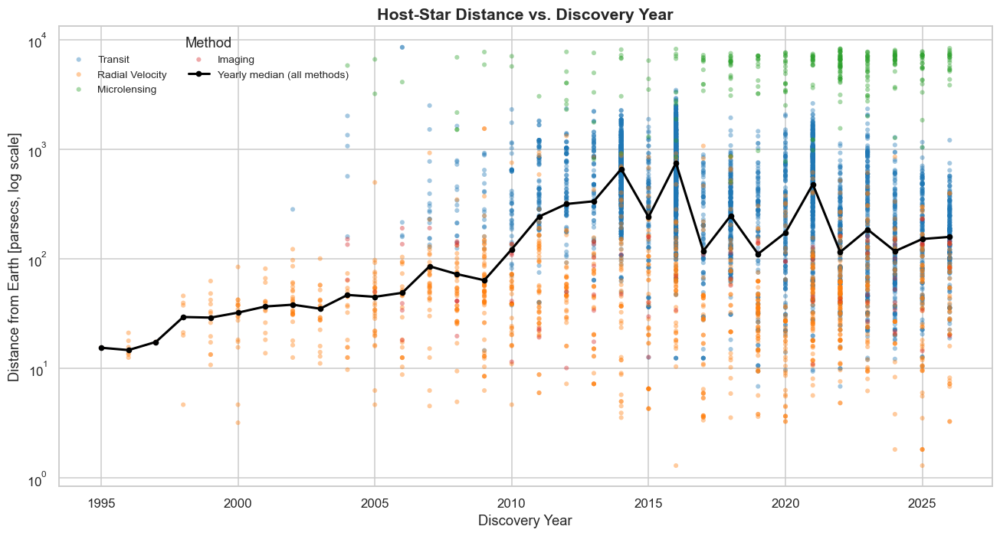

In [40]:
dist_df = data.dropna(subset=["sy_dist"]).copy()
dist_df = dist_df[dist_df["discoverymethod"].isin(top_methods)]

fig, ax = plt.subplots(figsize=(12, 6.5))

for method in top_methods:
    sub = dist_df[dist_df["discoverymethod"] == method]
    ax.scatter(sub["disc_year"], sub["sy_dist"], s=16, alpha=0.4,
               color=PALETTE[method], label=method, edgecolors="none")

yearly_median = dist_df.groupby("disc_year")["sy_dist"].median()
ax.plot(yearly_median.index, yearly_median.values, color="black", lw=2,
        marker="o", markersize=4, label="Yearly median (all methods)")

ax.set_yscale("log")
ax.set_xlabel("Discovery Year")
ax.set_ylabel("Distance from Earth [parsecs, log scale]")
ax.set_title("Host-Star Distance vs. Discovery Year", fontsize=14, weight="bold")
ax.legend(title="Method", frameon=False, loc="upper left", ncol=2, fontsize=9)

plt.tight_layout()
plt.show()


Radial velocity, the oldest method, stayed anchored to nearby, bright stars
it can measure precisely — its points sit in a fairly flat, close-in band
across all years. Once Kepler comes online (~2009), the transit method
pushes the yearly median distance sharply outward, because Kepler stared at
one faint, distant patch of sky rather than picking bright nearby targets.
Microlensing detections sit apart from the trend entirely, near the top of
the plot regardless of year, since that technique reaches the most distant
hosts of all almost by construction. The overall lesson: "how far we've
explored" tracks *which instrument was active*, not a smooth improvement in
technology over time.


## 5. 3D Spatial Distribution: Are Exoplanets Uniform in Space?

Section 4 showed distance changing over time, but flattened away sky
direction. Converting right ascension, declination, and distance into
Cartesian coordinates lets us plot where discovered systems actually sit in
3D space around Earth:

$$X = d\cos(dec)\cos(RA) \qquad Y = d\cos(dec)\sin(RA) \qquad Z = d\sin(dec)$$

If discoveries were uniformly distributed, we'd expect a roughly spherical,
evenly-filled cloud around Earth. Instead — as the toggles below make
visible — the cloud is lumpy and directional: it traces the shape of each
survey's field of view and distance reach, not a real physical structure of
the galaxy.

Use the two dropdowns to (1) recolour by discovery method or facility, and
(2) restrict the view to progressively larger distance cutoffs.


In [41]:
import plotly.graph_objects as go
from matplotlib.colors import to_hex

# --- Build 3D Cartesian coordinates from RA / Dec / Distance ---------------
pos = data.dropna(subset=["ra", "dec", "sy_dist"]).copy()
ra_rad = np.deg2rad(pos["ra"])
dec_rad = np.deg2rad(pos["dec"])
d = pos["sy_dist"]  # parsecs

pos["X"] = d * np.cos(dec_rad) * np.cos(ra_rad)
pos["Y"] = d * np.cos(dec_rad) * np.sin(ra_rad)
pos["Z"] = d * np.sin(dec_rad)

# Group facilities the same way methods were grouped, for a readable legend
top_facilities = pos["disc_facility"].value_counts().head(6).index.tolist()
pos["facility_grp"] = np.where(pos["disc_facility"].isin(top_facilities),
                                pos["disc_facility"], "Other")

method_groups = top_methods + ["Other"]
facility_groups = top_facilities + ["Other"]

METHOD_PALETTE_HEX = {k: to_hex(v) for k, v in PALETTE.items()}
METHOD_PALETTE_HEX["Other"] = "#999999"
FAC_PALETTE_HEX = dict(zip(facility_groups,
                            sns.color_palette("tab10", len(facility_groups)).as_hex()))

DIST_BINS = {
    "All distances": np.inf,
    "< 200 pc": 200,
    "< 500 pc": 500,
    "< 1000 pc": 1000,
    "< 2000 pc": 2000,
}


In [42]:
def scatter3d_trace(sub, name, color, visible):
    return go.Scatter3d(
        x=sub["X"], y=sub["Y"], z=sub["Z"],
        mode="markers",
        name=name,
        marker=dict(size=2.5, color=color, opacity=0.7),
        text=sub["pl_name"],
        hovertemplate="%{text}<br>X=%{x:.0f} Y=%{y:.0f} Z=%{z:.0f} pc<extra>" + name + "</extra>",
        visible=visible,
    )

# One set of traces coloured by method (shown first), one by facility (hidden first)
method_traces_info = [dict(sub=pos[pos["method_grp"] == g], name=g,
                            color=METHOD_PALETTE_HEX[g]) for g in method_groups]
facility_traces_info = [dict(sub=pos[pos["facility_grp"] == g], name=g,
                              color=FAC_PALETTE_HEX[g]) for g in facility_groups]

fig = go.Figure()
for info in method_traces_info:
    fig.add_trace(scatter3d_trace(info["sub"], info["name"], info["color"], visible=True))
for info in facility_traces_info:
    fig.add_trace(scatter3d_trace(info["sub"], info["name"], info["color"], visible=False))

n_method, n_facility = len(method_traces_info), len(facility_traces_info)
all_traces_info = method_traces_info + facility_traces_info


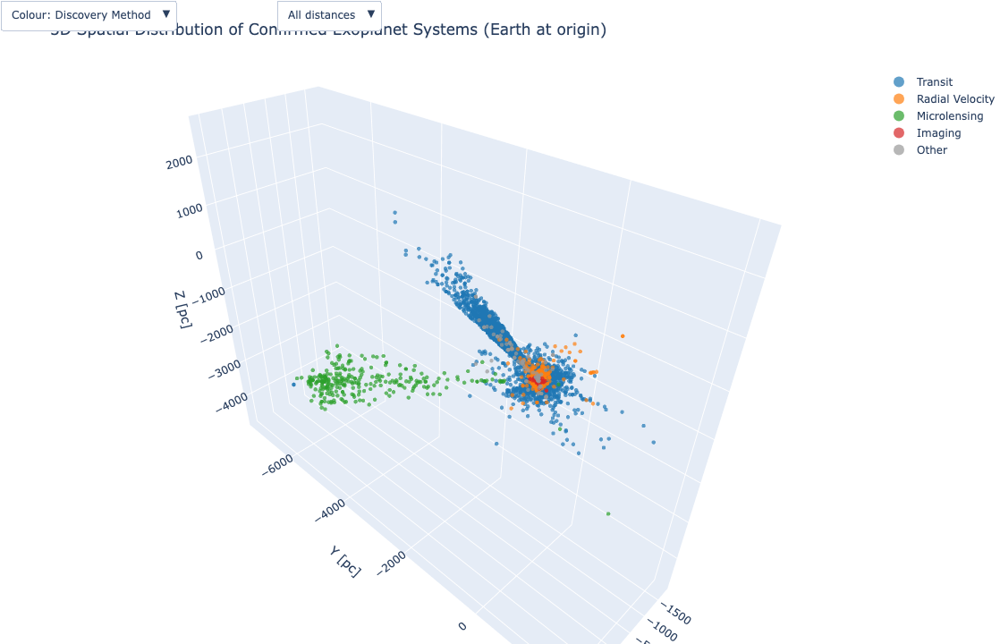

In [43]:
# --- Colour toggle: Discovery Method <-> Discovery Facility ---------------
color_buttons = [
    dict(label="Colour: Discovery Method", method="update",
         args=[{"visible": [True] * n_method + [False] * n_facility}]),
    dict(label="Colour: Discovery Facility", method="update",
         args=[{"visible": [False] * n_method + [True] * n_facility}]),
]

# --- Distance filter: restyle every trace's x/y/z to the chosen cutoff ----
def filtered_xyz(sub, max_d):
    s = sub if np.isinf(max_d) else sub[sub["sy_dist"] <= max_d]
    return s["X"].tolist(), s["Y"].tolist(), s["Z"].tolist()

dist_buttons = []
for label, max_d in DIST_BINS.items():
    xs, ys, zs = [], [], []
    for info in all_traces_info:
        x, y, z = filtered_xyz(info["sub"], max_d)
        xs.append(x); ys.append(y); zs.append(z)
    dist_buttons.append(dict(
        label=label, method="restyle",
        args=[{"x": xs, "y": ys, "z": zs}, list(range(len(all_traces_info)))],
    ))

fig.update_layout(
    title="3D Spatial Distribution of Confirmed Exoplanet Systems (Earth at origin)",
    scene=dict(xaxis_title="X [pc]", yaxis_title="Y [pc]", zaxis_title="Z [pc]",
               aspectmode="data"),
    updatemenus=[
        dict(buttons=color_buttons, direction="down", showactive=True,
             x=0.0, xanchor="left", y=1.12, yanchor="top"),
        dict(buttons=dist_buttons, direction="down", showactive=True,
             x=0.32, xanchor="left", y=1.12, yanchor="top"),
    ],
    legend=dict(itemsizing="constant"),
    margin=dict(l=0, r=0, t=70, b=0),
    height=720,
)
fig.show()


**What to look for:** switch to "< 200 pc" and the cloud is dominated by
radial-velocity systems scattered fairly evenly around Earth — RV targets
are picked star-by-star from the nearby, bright-star catalog. Pull the
cutoff out to "< 1000 pc" or "All distances" and a dense, narrow wedge of
transit detections appears, aimed at Kepler's fixed field — even though
those planets are far more numerous, they occupy a tiny slice of sky
direction. This is the clearest evidence in the notebook that the shape of
the discovered-planet cloud is a fingerprint of *survey geometry*, not the
true 3D distribution of planets in the galaxy.


## 6. Takeaways

- **Time:** the discovery curve is dominated by a handful of mission-driven
  step-changes (Kepler validation batches, TESS launch), not steady organic
  growth.
- **Method to what:** each technique has a distinct signature in
  period/radius/mass space that traces its physical detection bias, not a
  true underlying population of planets.
- **Method to where:** distance-over-time and 3D spatial spread are shaped
  almost entirely by *survey design* (Kepler's fixed narrow field vs.
  ground-based RV target lists vs. microlensing toward the galactic bulge),
  which is a strong caveat for anyone using this catalog to estimate real
  planet occurrence rates.

**Suggested next step for the write-up:** pair this with an occurrence-rate
correction (e.g. from the Kepler pipeline completeness tables) if the course
project needs to argue about the *true* population of planets in the galaxy,
rather than just the discovered one.
